In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, ReLU, BatchNormalization, Concatenate

print(tf.__version__)
print(keras.__version__)

1.13.1
2.2.4-tf


In [2]:
tf.enable_eager_execution()

In [3]:
learning_rate = 0.001
num_epochs = 30
batch_size = 1
img_size = 256
num_trainimgs = 234
num_valimgs = 26
#decay_step = int(num_trainimgs / batch_size * 10)
decay_step = num_trainimgs // batch_size * 10
decay_rate = 0.5
seed = 777
tf.set_random_seed(seed)

In [4]:
cur_dir = os.getcwd()
data_dir = cur_dir
#data_dir = '/content/gdrive/My Drive/TensorFlow_Training_12th/'
TRAIN_FILE = 'train_images.tfrecords'
VALIDATION_FILE = 'val_images.tfrecords'

In [5]:
## tfrecord parsing
def read_and_decode(tfrecord_serialized):
    features={'img_raw': tf.FixedLenFeature([], tf.string),
             'label_raw': tf.FixedLenFeature([], tf.string)}
    parsed_features = tf.parse_single_example(tfrecord_serialized, features)
    
    image = tf.decode_raw(parsed_features['img_raw'], tf.int64)
    #image.set_shape([65536])
    image_re = tf.reshape(image, [img_size, img_size, 1])
    image_re = tf.cast(image_re, tf.float32) * (1. / 1024)
    label = tf.decode_raw(parsed_features['label_raw'], tf.uint8)
    #label.set_shape([65536])
    label_re = tf.reshape(label, [img_size, img_size])
    
    return image_re, label_re

In [6]:
## Dataset 구성
def make_dataset(batch_size, tfrecord_path):    
    dataset = tf.data.TFRecordDataset(tfrecord_path)
    dataset = dataset.map(read_and_decode, num_parallel_calls=8)
    dataset = dataset.shuffle(buffer_size=10000).prefetch(buffer_size=batch_size).batch(batch_size)
    return dataset   

In [7]:
## Network 구성 - simplified U-Net
def create_model():
    inputs = Input(shape=(img_size, img_size, 1))
    
    conv1 = Conv2D(64, 3, 1, 'SAME', activation=ReLU())(inputs)
    
    conv2 = Conv2D(128, 5, 2, 'SAME', activation=ReLU())(conv1)
    
    conv3 = Conv2D(256, 5, 2, 'SAME', activation=ReLU())(conv2)
    
    conv4 = Conv2D(512, 5, 2, 'SAME', activation=ReLU())(conv3)
    
    conv5 = Conv2D(1024, 5, 2, 'SAME', activation=ReLU())(conv4)
    
    upconv6 = Conv2DTranspose(512, 5, 2, 'SAME', activation=ReLU())(conv5)
    concat6 = Concatenate()([conv4, upconv6])
    conv6 = Conv2D(512, 3, 1, 'SAME', activation=ReLU())(concat6)
    
    upconv7 = Conv2DTranspose(256, 5, 2, 'SAME', activation=ReLU())(conv6)
    concat7 = Concatenate()([conv3, upconv7])
    conv7 = Conv2D(256, 3, 1, 'SAME', activation=ReLU())(concat7)
    
    upconv8 = Conv2DTranspose(128, 5, 2, 'SAME', activation=ReLU())(conv7)
    concat8 = Concatenate()([conv2, upconv8])
    conv8 = Conv2D(128, 3, 1, 'SAME', activation=ReLU())(concat8)
    
    upconv9 = Conv2DTranspose(64, 5, 2, 'SAME', activation=ReLU())(conv8)
    concat9 = Concatenate()([conv1, upconv9])
    conv9 = Conv2D(64, 3, 1, 'SAME', activation=ReLU())(concat9)
    
    conv10 = Conv2D(64, 3, 1, 'SAME', activation=ReLU())(conv9)
    
    conv11 = Conv2D(2, 1, 1, 'SAME')(conv10)
    
    return keras.Model(inputs=inputs, outputs=conv11)

In [8]:
model = create_model()
model.summary()

Instructions for updating:
Colocations handled automatically by placer.
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 256, 256, 1)  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 64) 640         input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 128, 128, 128 204928      conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 64, 64, 256)  819456      conv2d_1[0][0]                   
_____________________________________

In [9]:
## loss function 정의 - cross entropy
def loss_fn(model, images, labels):
    logits = model(images, training=True)
    labels = tf.cast(labels, tf.int64)    
    
    logits_re = tf.reshape(logits, [-1, 2])
    labels_re = tf.reshape(labels, [-1])    
    
    cross_entropy = tf.nn.sparse_softmax_cross_entropy_with_logits(
        labels=labels, logits=logits, name='cross_entropy')
        
    loss = tf.reduce_mean(cross_entropy, name='simple_cross_entropy_mean')
    
    return loss

In [10]:
def grad(model, images, labels):
    with tf.GradientTape() as tape:
        loss = loss_fn(model, images, labels)
    return tape.gradient(loss, model.variables)

In [11]:
## calculate accuracy
def evaluate(model, images, labels):
    logits = model(images, training=False)
    labels = tf.cast(labels, tf.int64)    

    logits_re = tf.reshape( logits, [-1, 2] )
    labels_re = tf.reshape( labels, [-1] )    

    correct = tf.nn.in_top_k(logits_re, labels_re, 1)
    
    return tf.reduce_mean(tf.cast(correct, tf.float32))

In [12]:
global_step = tf.train.get_or_create_global_step()
lr_decay = tf.train.exponential_decay(learning_rate, global_step, 
                                      decay_step, decay_rate, staircase=True)
#optimizer = tf.train.GradientDescentOptimizer(learning_rate=lr_decay)
optimizer = tf.train.AdamOptimizer(learning_rate=lr_decay)

In [13]:
train_tfr_path = os.path.join(data_dir, TRAIN_FILE)
val_tfr_path = os.path.join(data_dir, VALIDATION_FILE)

train_dataset = make_dataset(batch_size, train_tfr_path)
val_dataset = make_dataset(batch_size, val_tfr_path)

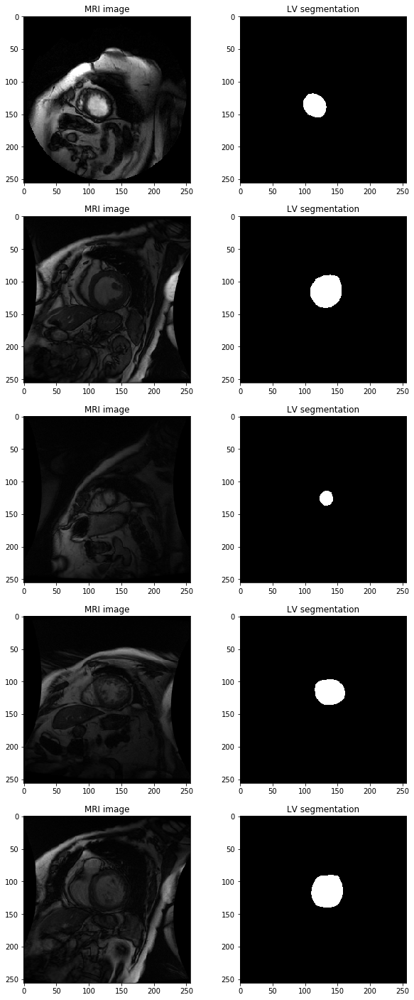

In [14]:
num_fig = 5
fig_cnt = 0
plt.figure(figsize=(10,25))
for images, labels in train_dataset:    
    plt.subplot(num_fig, 2, 2*fig_cnt+1)
    plt.title('MRI image')
    plt.imshow(images[0,:,:,0], cmap='gray', vmin=0, vmax=1)
    plt.subplot(num_fig, 2, 2*fig_cnt+2)
    plt.title('LV segmentation')
    plt.imshow(labels[0], cmap='gray', vmin=0, vmax=1)
    fig_cnt += 1
    if fig_cnt == num_fig:
        break

Learning started. It takes sometime.
Epoch: 1 loss = 0.20353693 train accuracy =  0.9837 validation accuracy =  0.9823


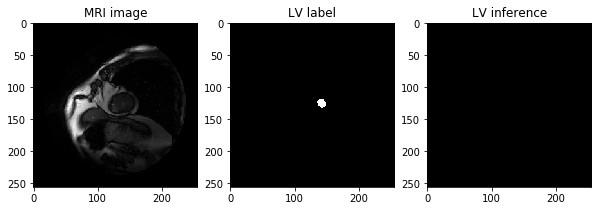

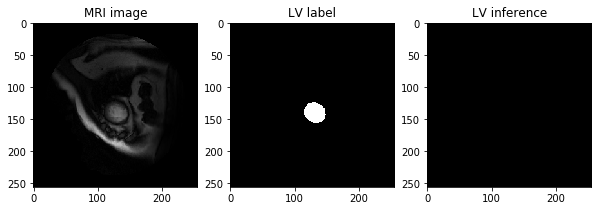

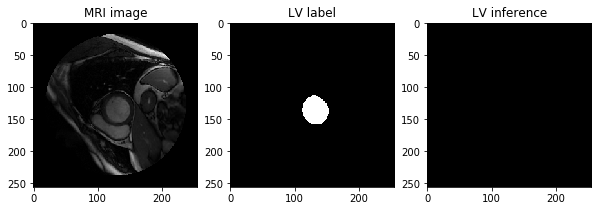

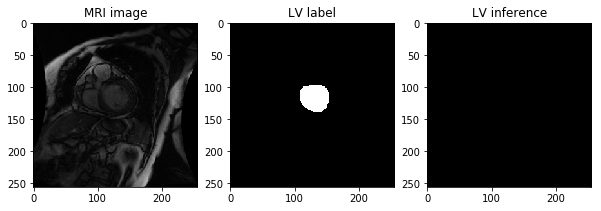

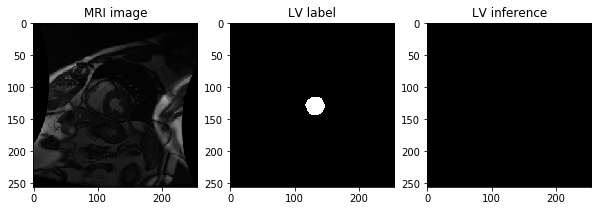

...

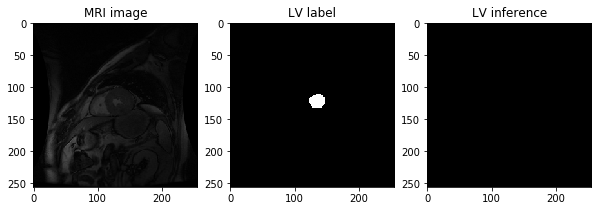

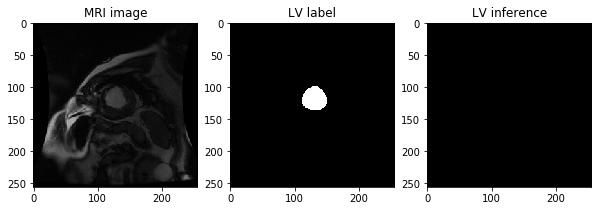

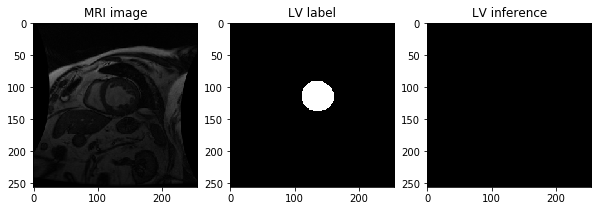

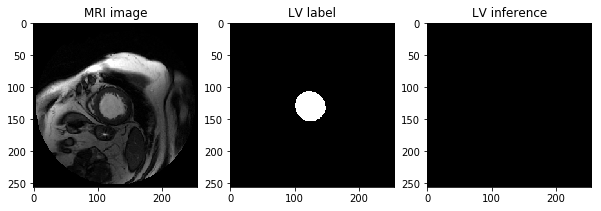

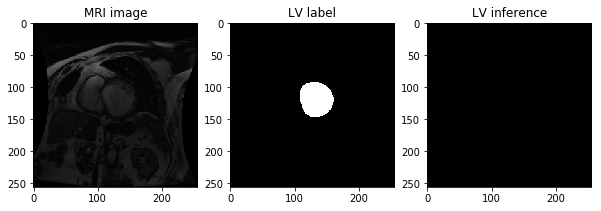

Epoch: 2 loss = 0.04582712 train accuracy =  0.9841 validation accuracy =  0.9801
Epoch: 3 loss = 0.04246763 train accuracy =  0.9853 validation accuracy =  0.9847
Epoch: 4 loss = 0.02936563 train accuracy =  0.9874 validation accuracy =  0.9883
Epoch: 5 loss = 0.02489864 train accuracy =  0.9906 validation accuracy =  0.9897
Epoch: 6 loss = 0.01973200 train accuracy =  0.9928 validation accuracy =  0.9922
Epoch: 7 loss = 0.01426148 train accuracy =  0.9948 validation accuracy =  0.9947
Epoch: 8 loss = 0.01337421 train accuracy =  0.9950 validation accuracy =  0.9927
Epoch: 9 loss = 0.01071843 train accuracy =  0.9958 validation accuracy =  0.9952


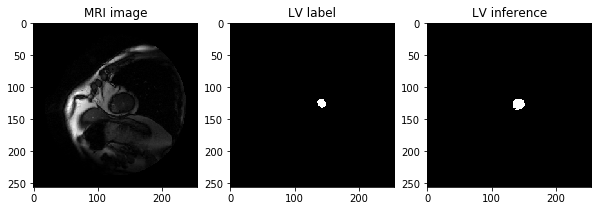

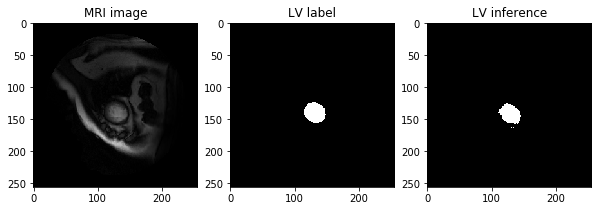

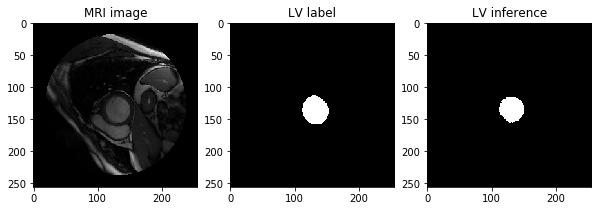

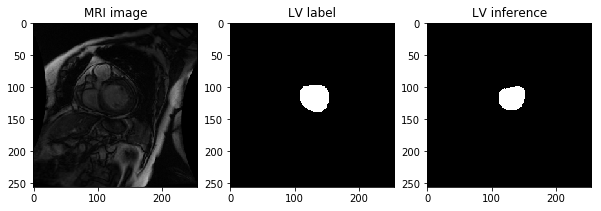

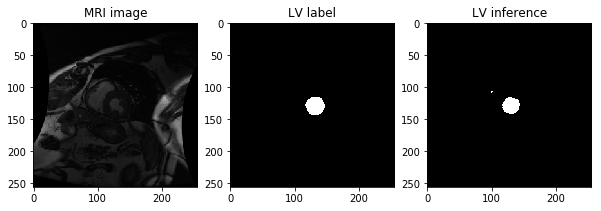

...

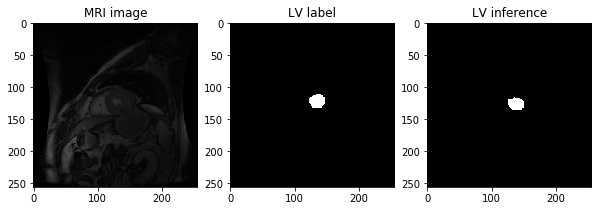

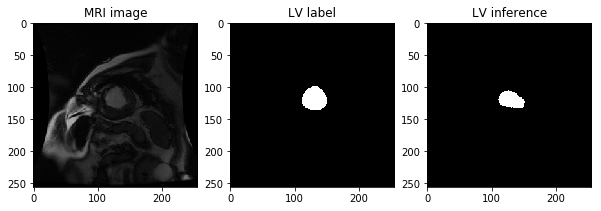

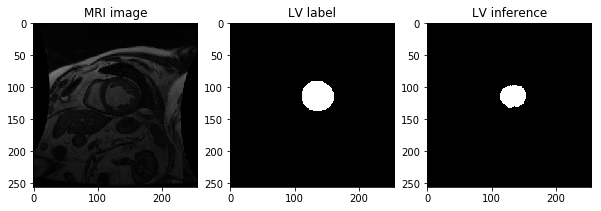

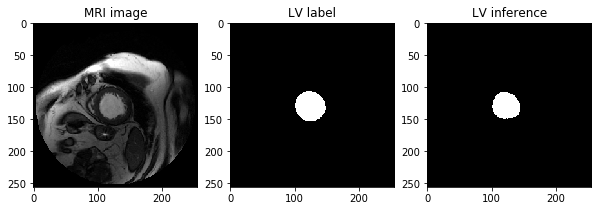

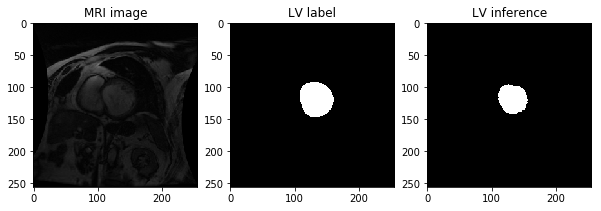

Epoch: 10 loss = 0.00839725 train accuracy =  0.9967 validation accuracy =  0.9959


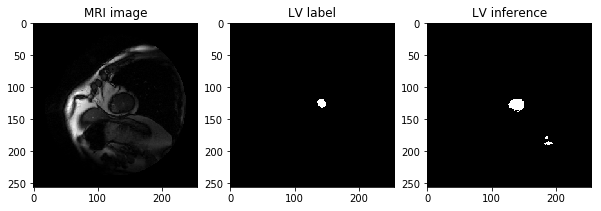

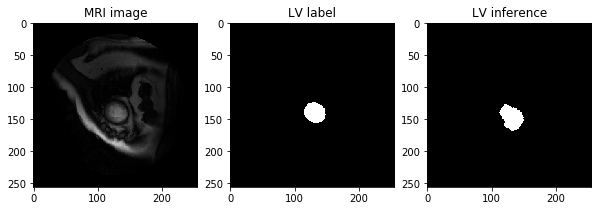

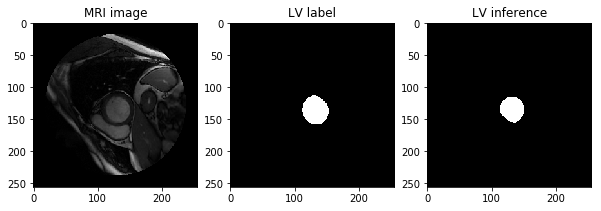

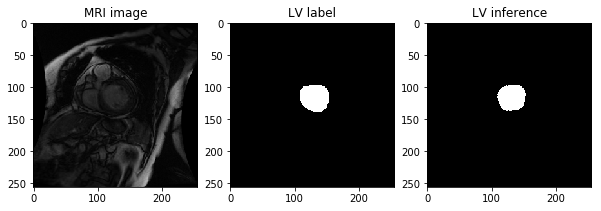

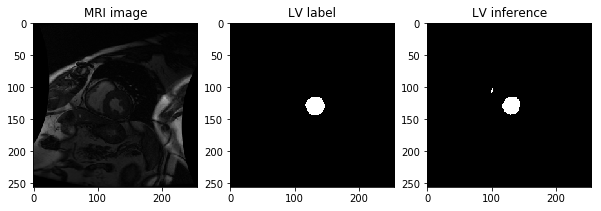

...

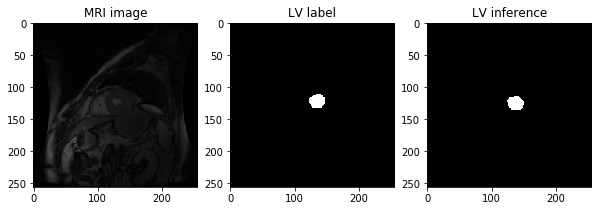

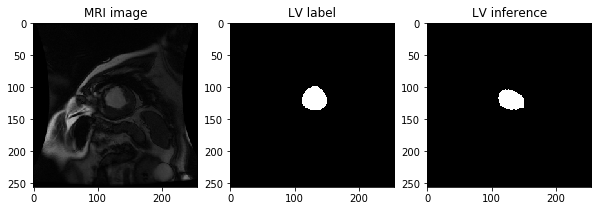

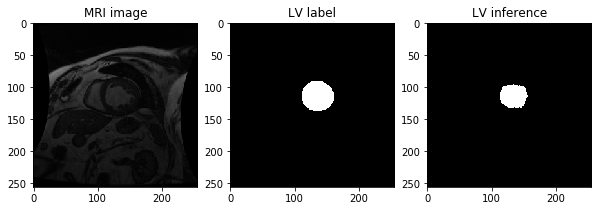

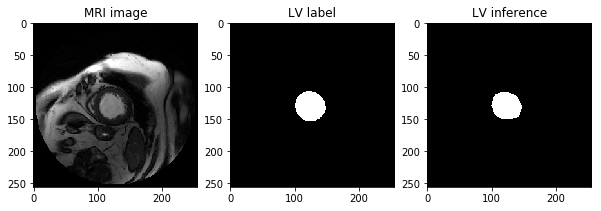

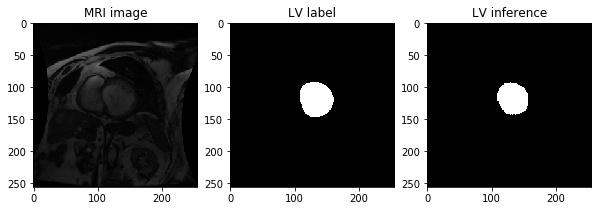

Epoch: 11 loss = 0.00723220 train accuracy =  0.9971 validation accuracy =  0.9961


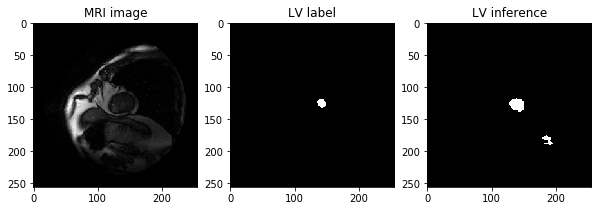

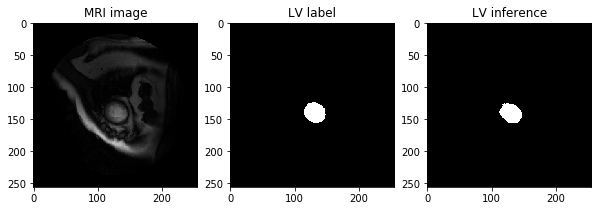

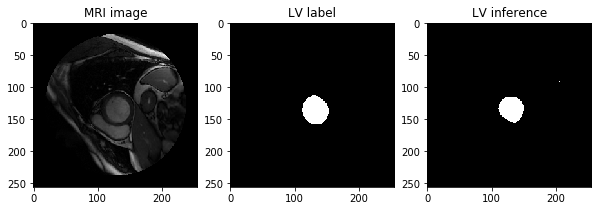

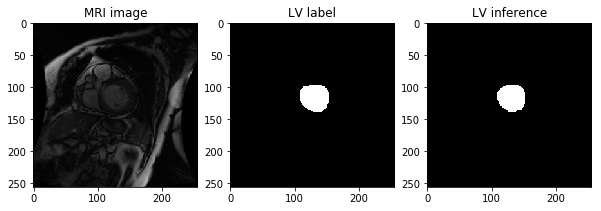

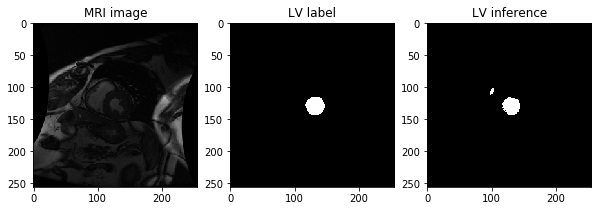

...

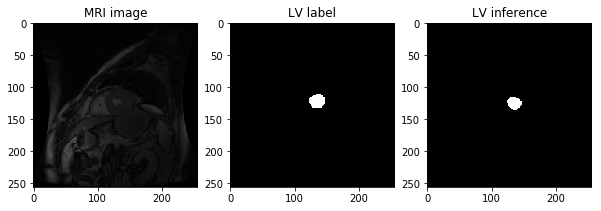

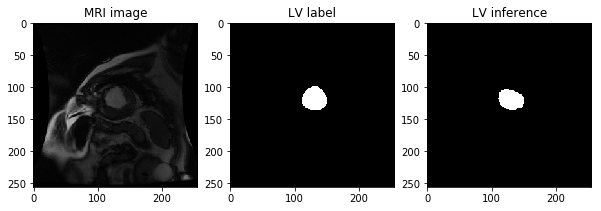

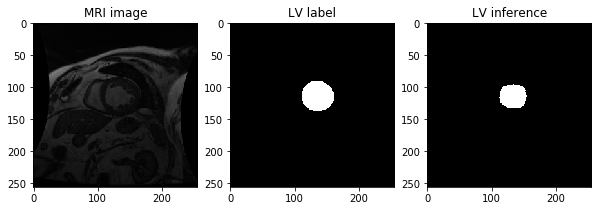

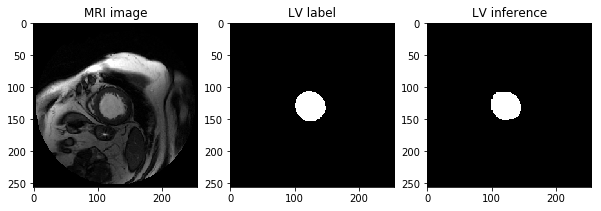

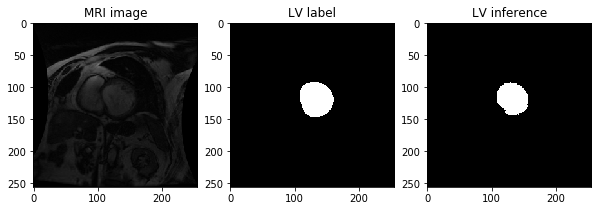

Epoch: 12 loss = 0.00631862 train accuracy =  0.9974 validation accuracy =  0.9964


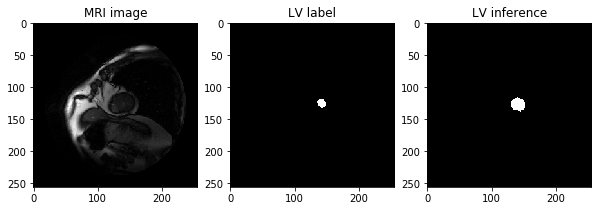

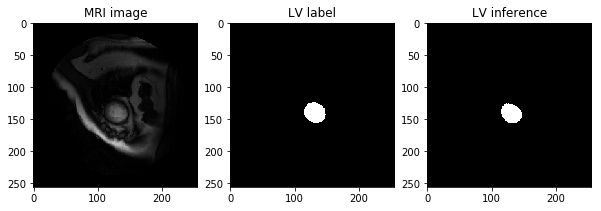

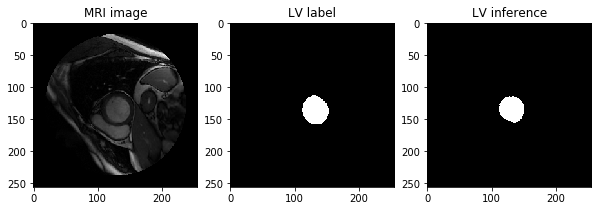

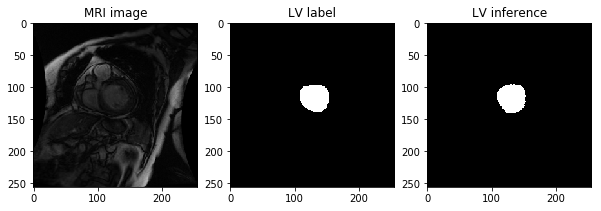

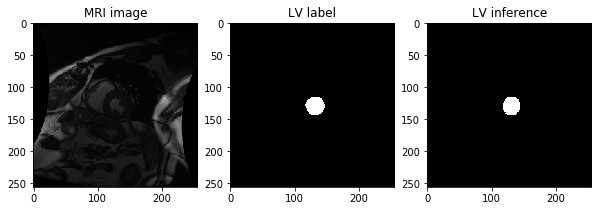

...

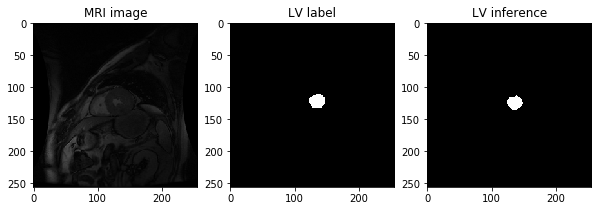

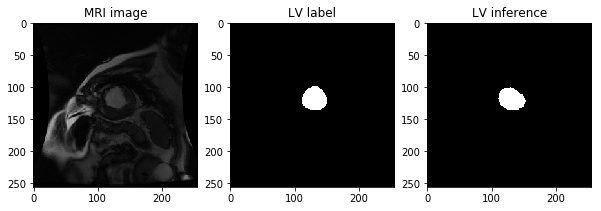

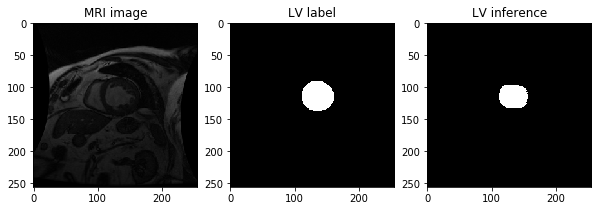

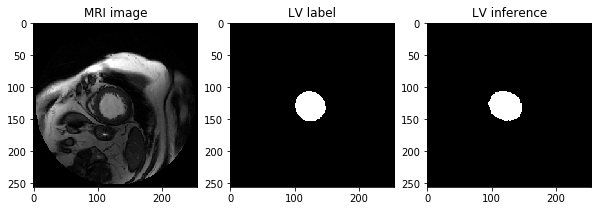

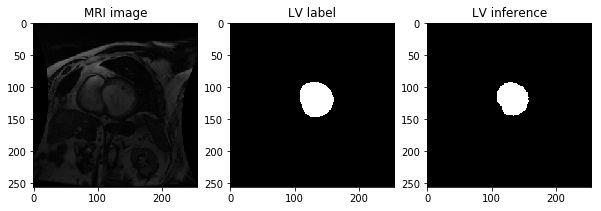

Epoch: 13 loss = 0.00631775 train accuracy =  0.9974 validation accuracy =  0.9932
Epoch: 14 loss = 0.01965653 train accuracy =  0.9938 validation accuracy =  0.9936
Epoch: 15 loss = 0.00814454 train accuracy =  0.9969 validation accuracy =  0.9966


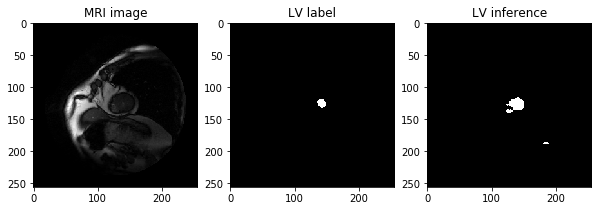

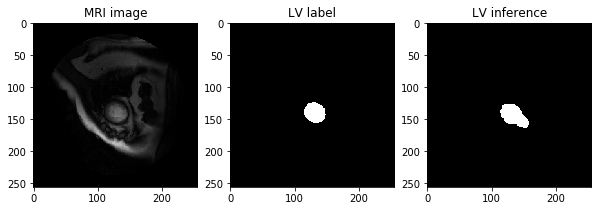

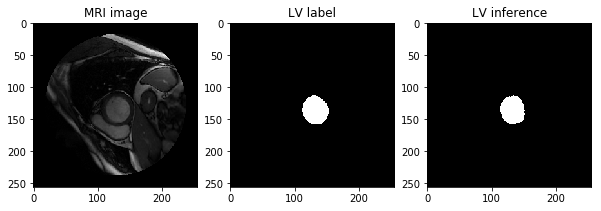

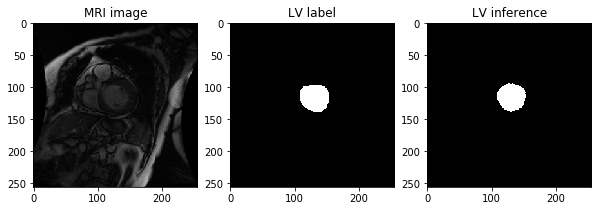

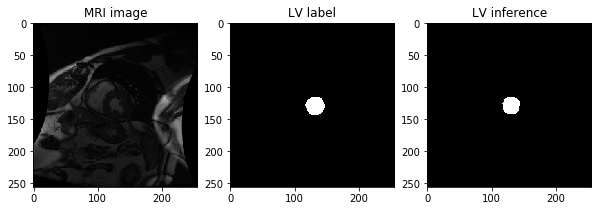

...

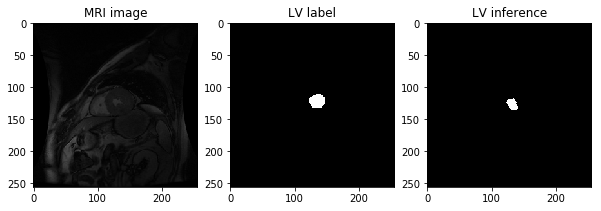

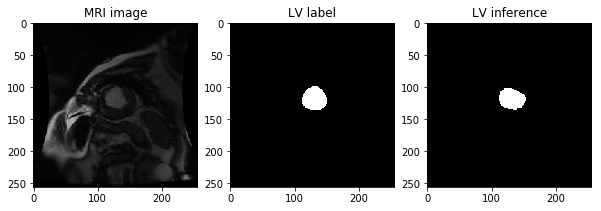

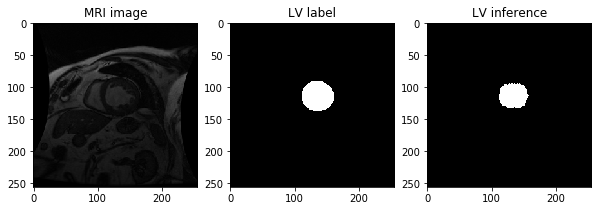

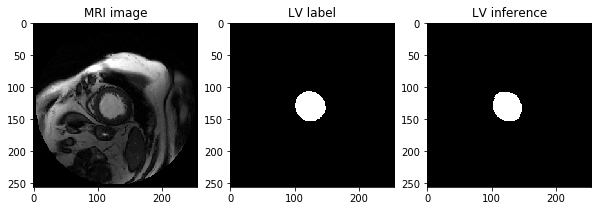

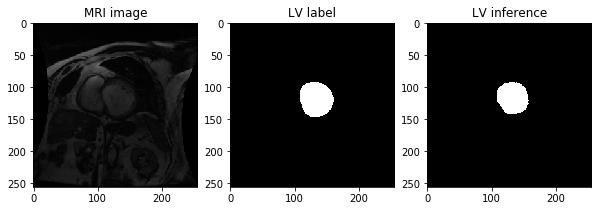

Epoch: 16 loss = 0.00634011 train accuracy =  0.9974 validation accuracy =  0.9964
Epoch: 17 loss = 0.00532201 train accuracy =  0.9978 validation accuracy =  0.9968


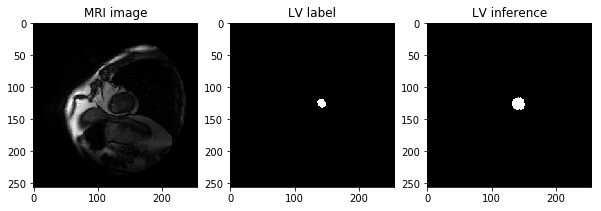

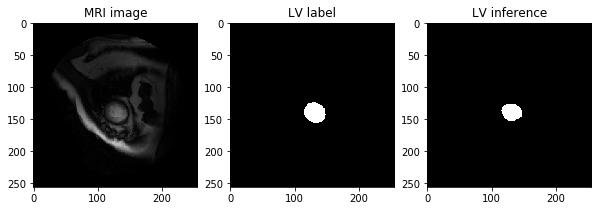

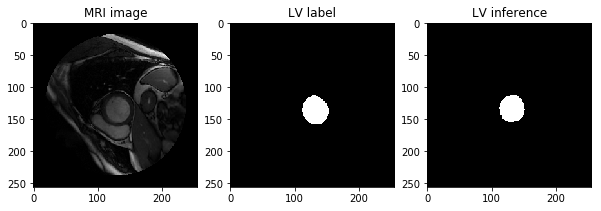

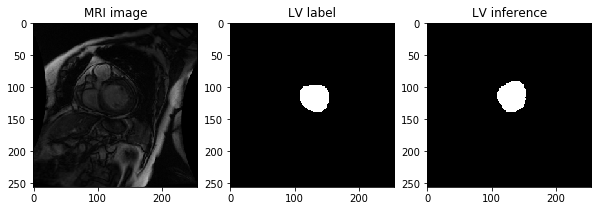

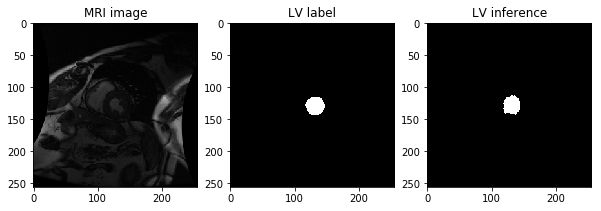

...

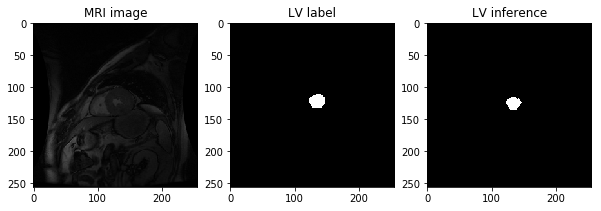

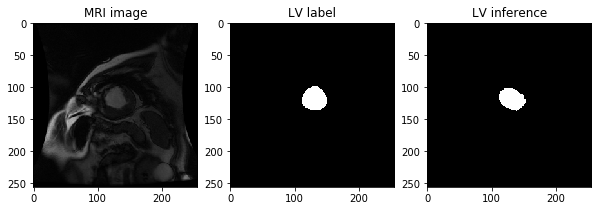

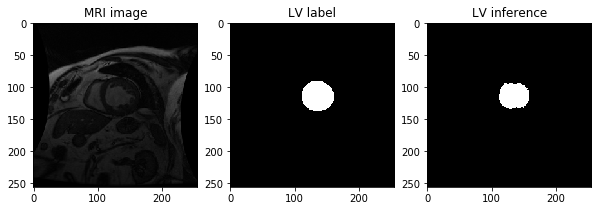

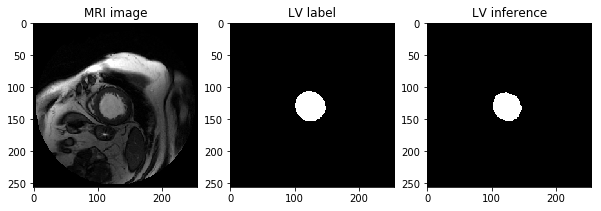

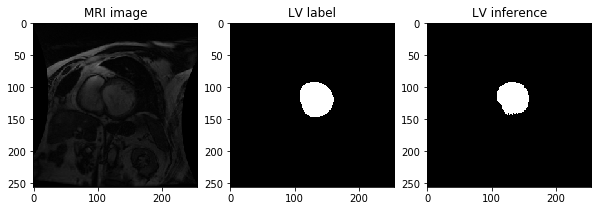

Epoch: 18 loss = 0.00480591 train accuracy =  0.9980 validation accuracy =  0.9969


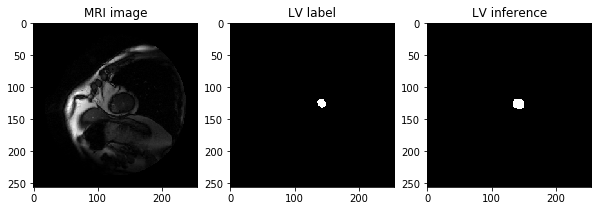

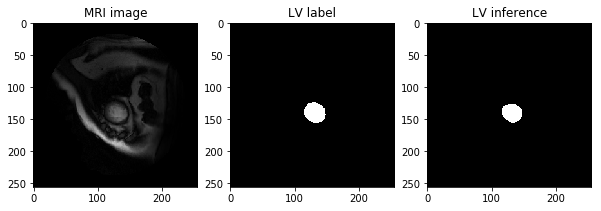

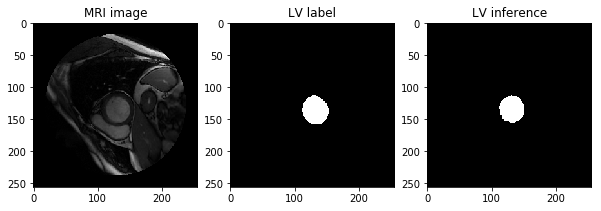

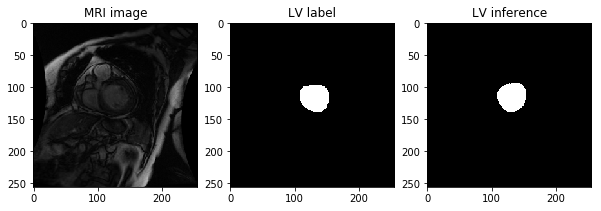

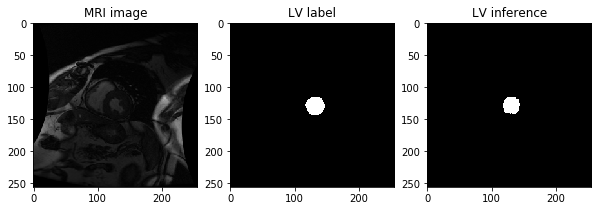

...

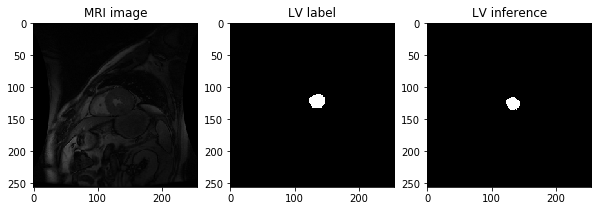

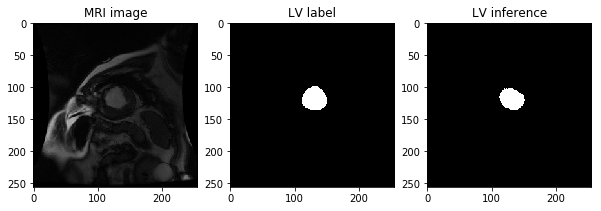

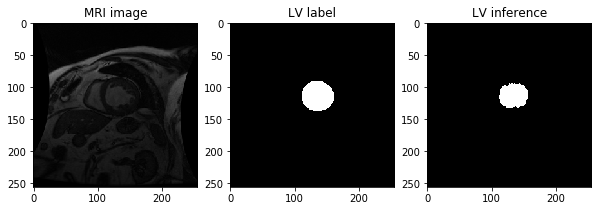

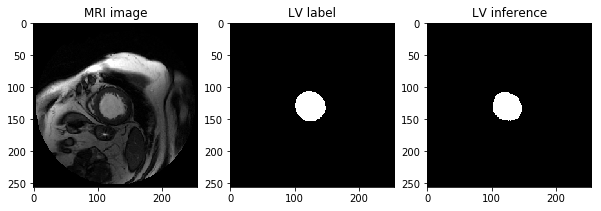

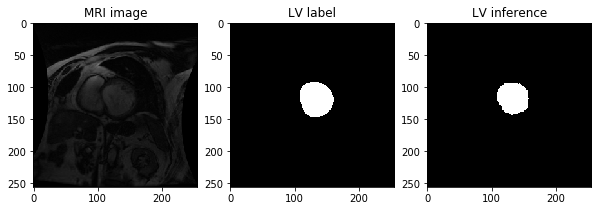

Epoch: 19 loss = 0.00433740 train accuracy =  0.9982 validation accuracy =  0.9971


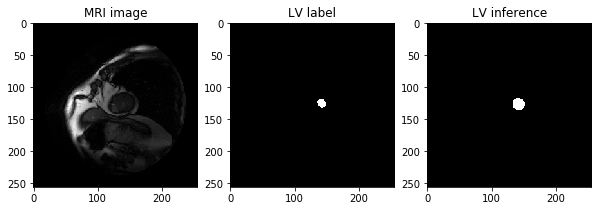

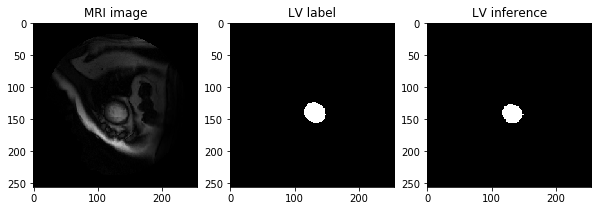

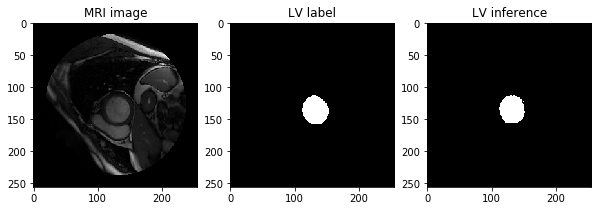

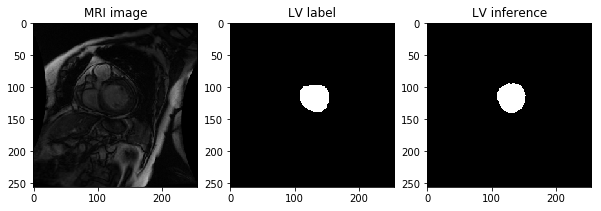

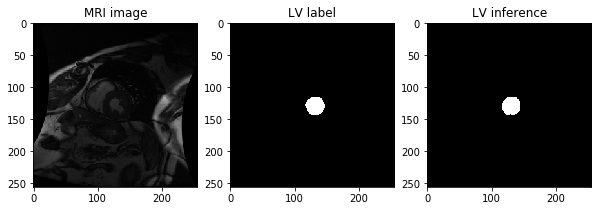

...

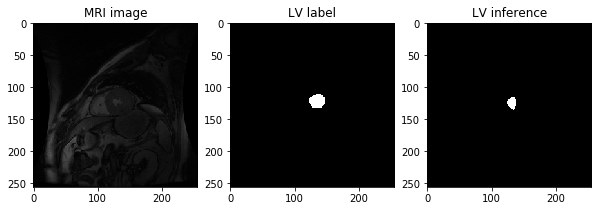

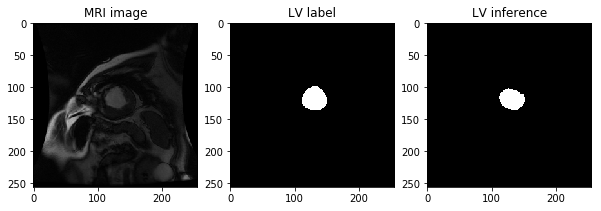

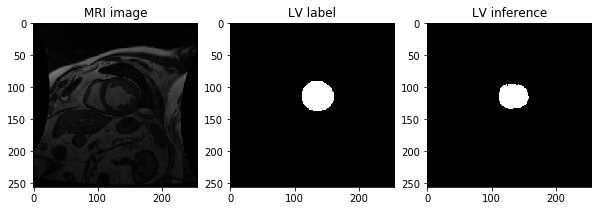

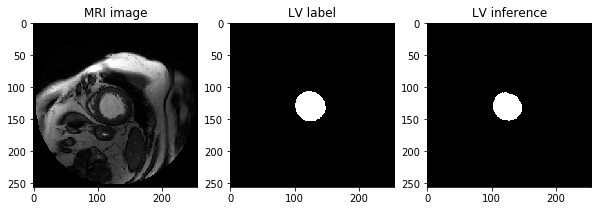

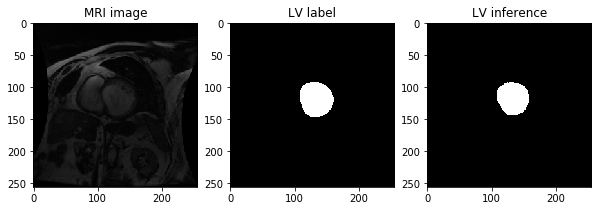

Epoch: 20 loss = 0.00420158 train accuracy =  0.9982 validation accuracy =  0.9970
Epoch: 21 loss = 0.01184808 train accuracy =  0.9958 validation accuracy =  0.9956
Epoch: 22 loss = 0.00633151 train accuracy =  0.9975 validation accuracy =  0.9957
Epoch: 23 loss = 0.00497608 train accuracy =  0.9980 validation accuracy =  0.9962
Epoch: 24 loss = 0.00446757 train accuracy =  0.9982 validation accuracy =  0.9966
Epoch: 25 loss = 0.00406155 train accuracy =  0.9983 validation accuracy =  0.9966
Epoch: 26 loss = 0.00388430 train accuracy =  0.9984 validation accuracy =  0.9962
Epoch: 27 loss = 0.00515176 train accuracy =  0.9980 validation accuracy =  0.9948
Epoch: 28 loss = 0.00847220 train accuracy =  0.9970 validation accuracy =  0.9950
Epoch: 29 loss = 0.00495921 train accuracy =  0.9980 validation accuracy =  0.9971
Epoch: 30 loss = 0.00404074 train accuracy =  0.9983 validation accuracy =  0.9951
Learning Finished!


In [15]:
# train my model
print('Learning started. It takes sometime.')
best_val_acc = 0.
for epoch in range(num_epochs):
    avg_loss = 0.
    avg_train_acc = 0.
    avg_val_acc = 0.    
    train_step = 0
    val_step = 0
    
    for images, labels in train_dataset:
        images = tf.image.resize(images, (img_size, img_size))                
        grads = grad(model, images, labels)                
        optimizer.apply_gradients(zip(grads, model.variables))
        loss = loss_fn(model, images, labels)
        acc = evaluate(model, images, labels)        
        avg_loss = avg_loss + loss
        avg_train_acc = avg_train_acc + acc
        train_step += 1
    avg_loss = avg_loss / train_step
    avg_train_acc = avg_train_acc / train_step
    
    for images, labels in val_dataset:
        images = tf.image.resize(images, (img_size, img_size))
        acc = evaluate(model, images, labels)        
        avg_val_acc = avg_val_acc + acc
        val_step += 1
    avg_val_acc = avg_val_acc / val_step    

    print('Epoch:', '{}'.format(epoch + 1), 'loss =', '{:.8f}'.format(avg_loss), 
          'train accuracy = ', '{:.4f}'.format(avg_train_acc), 
          'validation accuracy = ', '{:.4f}'.format(avg_val_acc))
    
    if((avg_val_acc > best_val_acc and avg_val_acc > 0.995) or epoch == 0):    
        best_val_acc = avg_val_acc        
        for images, labels in val_dataset:
            logits = model(images, training=False)
            logits = tf.reshape(logits, (-1, 2))
            logits = tf.nn.softmax(logits)            
            
            val_images = np.reshape(images, (256, 256))
            val_labels = np.reshape(labels, (256, 256))
            val_logits = np.reshape(logits[:,1], (256, 256))            
            val_logits[val_logits >= 0.5] = 1
            val_logits[val_logits < 0.5] = 0            
        
            plt.figure(figsize=(10,50))
            plt.subplot(131)
            plt.title('MRI image')
            plt.imshow(val_images, cmap='gray', vmin=0, vmax=1)
            plt.subplot(132)
            plt.title('LV label')
            plt.imshow(val_labels, cmap='gray', vmin=0, vmax=1)
            plt.subplot(133)
            plt.title('LV inference')
            plt.imshow(val_logits, cmap='gray', vmin=0, vmax=1)
            plt.show()

print('Learning Finished!')